In [234]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn import linear_model
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import pydotplus
from IPython.display import Image
from sklearn.tree import export_graphviz  
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [255]:
# read file to make dataset
from library.common import Database, Core
from pathlib import Path
import pandas as pd

db = Database()
db_table = 'owid_co2_greenhouse_gas_emissions'
data_sql = pd.read_sql('consolidated_data', db.config)


data = pd.read_csv('consolidated_data')


In [256]:
# replace null space to '_' and change columns to new one  
new_columns = []
for i in data.columns:
    new_columns.append(i.replace(' ','_'))
    
data.columns = new_columns

#data.columns

In [257]:
# extract countries
df_all = data
df_con = df_all[df_all['Country_Name'] != 'World']
df_con.head()

,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Medium_to_High_Tech_%,Export,...,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Primary_Energy_Consumption_per_capita,Fossil_Energy_Consumption_Share,Renewable_Electricity_Production_Share,Energy_Intensity,Renewable_Energy_Consumption_Share,region,income_group
0,Aruba,ABW,1960,619.0,54208.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Latin America & Caribbean,High income
1,Afghanistan,AFG,1960,414.0,8996967.0,537777811.1,NaN,3.112143e+08,NaN,22222233.33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,South Asia,Low income
2,Angola,AGO,1960,549.0,5454938.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sub-Saharan Africa,Lower middle income
3,Albania,ALB,1960,2023.0,1608800.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe & Central Asia,Upper middle income
4,Andorra,AND,1960,NaN,13410.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe & Central Asia,High income


In [258]:
features_all = ['Country_Name', 'Country_Code', 'Year', 'CO2_Emission', 'Population', 'Current_GDP', 'Constant_GDP', 'Manufacturing_GDP', 'Medium_to_High_Tech_%', 'Export', 'Import', 'Real_GDP_Growth_%', 'Urban_Population_Percent', 'Merchandise_Export', 'Merchandise_Import', 'Manufacturer_Export_Share', 'Manufacturer_Export', 'CO2_Emission_Electricity', 'CO2_Emission_Building', 'CO2_Emission_Manufacturing', 'CO2_Emission_Other_Fuel', 'CO2_Emission_Fugitive', 'CO2_Emission_Transport', 'CO2_Emission_Energy_Subtotal', 'CO2_Emission_Bunkers', 'CO2_Emission_Industrial_Process', 'CO2_Emission_per_capita', 'Constant_GDP_per_capita', 'Manufacturing_%', 'Medium_to_High_Tech_GDP', 'CO2_Emission_per_constant_GDP', 'Trade_Openness', 'Share_of_Merchandise_Export', 'Share_of_Merchandise_Import', 'Industrial_GDP', 'CO2_Country_Share_%', 'Manufacturing_Country_Share_%', 'Primary_Energy_Consumption', 'Renewable_Energy_Consumption', 'Coal_Consumption', 'Oil_Consumption', 'Total_Electricity_Production', 'Electricity_Production_from_Renewable', 'Primary_Energy_Consumption_per_capita', 'Fossil_Energy_Consumption_Share', 'Renewable_Electricity_Production_Share', 'Energy_Intensity', 'Renewable_Energy_Consumption_Share', 'region', 'income_group']
# deploying features_select for clustering
features_select = ['Country_Name', 'Country_Code', 'Year', 'CO2_Emission', 'Population', 'Current_GDP', 'Constant_GDP', 'Manufacturing_GDP', 'Export', 'Import', 'Urban_Population_Percent', 'Merchandise_Export', 'Merchandise_Import', 'Manufacturer_Export', 'CO2_Emission_Electricity', 'CO2_Emission_Building', 'CO2_Emission_Manufacturing', 'CO2_Emission_Other_Fuel', 'CO2_Emission_Fugitive', 'CO2_Emission_Transport', 'CO2_Emission_Energy_Subtotal', 'CO2_Emission_Bunkers', 'CO2_Emission_Industrial_Process', 'Medium_to_High_Tech_GDP', 'Trade_Openness', 'Industrial_GDP', 'Primary_Energy_Consumption', 'Renewable_Energy_Consumption', 'Coal_Consumption', 'Oil_Consumption', 'Total_Electricity_Production', 'Electricity_Production_from_Renewable', 'Energy_Intensity']
df_con = df_con[features_select]

In [259]:
# using G20 countries for clustering
G20 = ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'France', 'Germany', 'India', 'Indonesia', 
       'Italy', 'Japan', 'Mexico', 'Russia', 'Saudi Arabia', 'South Africa', 'Korea, Rep.', 'Turkey', 'United Kingdom','United States'] 
g20 = pd.DataFrame(G20, columns=['Country_Name'])
df_g20 = pd.merge(df_con, g20, on='Country_Name', how='inner')

# substitute NaN to zero for appropriate clustering
df_g20 = df_g20[(df_g20['Year']>=2000)&(df_g20['Year']<=2018)].fillna(0)
df_g20.head()

,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Export,Import,...,Medium_to_High_Tech_GDP,Trade_Openness,Industrial_GDP,Primary_Energy_Consumption,Renewable_Energy_Consumption,Coal_Consumption,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Energy_Intensity
40,Argentina,ARG,2000,142358.0,36870796.0,3.080000e+11,4.290000e+11,4.314816e+10,3.122369e+10,3.307015e+10,...,1.233854e+10,20.874622,7.386693e+10,2577.258637,253.808420,0.0,0.0,0.0,0.0,0.143489
41,Argentina,ARG,2001,134004.0,37275644.0,2.910000e+11,4.100000e+11,3.980199e+10,3.111242e+10,2.760388e+10,...,1.073962e+10,20.177423,6.782829e+10,2451.631652,282.155828,0.0,0.0,0.0,0.0,0.142820
42,Argentina,ARG,2002,124392.0,37681743.0,1.110000e+11,3.650000e+11,1.910191e+10,2.773661e+10,1.306582e+10,...,4.966621e+09,36.758950,2.986224e+10,2382.759922,276.855249,0.0,0.0,0.0,0.0,0.155921
43,Argentina,ARG,2003,134631.0,38087866.0,1.400000e+11,3.980000e+11,2.681019e+10,3.308451e+10,1.877290e+10,...,6.970823e+09,37.041003,4.165089e+10,2549.530298,275.976462,0.0,0.0,0.0,0.0,0.153001
44,Argentina,ARG,2004,157043.0,38491970.0,1.660000e+11,4.340000e+11,3.140563e+10,3.926700e+10,2.773667e+10,...,8.092605e+09,40.363656,4.744935e+10,2785.158377,258.705009,0.0,0.0,0.0,0.0,0.153277


In [260]:
# select year from 2000 to 2018 for all countries
df_year = df_con[(df_con['Year']>=2000)&(df_con['Year']<=2018)]

# substitute NaN to zero for appropriate clustering
df_year = df_year.fillna(0)
df_year.head()

,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Export,Import,...,Medium_to_High_Tech_GDP,Trade_Openness,Industrial_GDP,Primary_Energy_Consumption,Renewable_Energy_Consumption,Coal_Consumption,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Energy_Intensity
8720,Aruba,ABW,2000,2378.0,90866.0,1.963194e+09,2.814470e+09,6.271782e+07,1.393855e+09,1.324022e+09,...,0.000000e+00,138.441596,2.964804e+08,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
8721,Afghanistan,AFG,2000,758.0,20779957.0,3.342034e+09,5.344642e+09,5.426053e+08,0.000000e+00,0.000000e+00,...,7.374464e+07,0.000000,0.000000e+00,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
8722,Angola,AGO,2000,9516.0,16395477.0,1.220735e+10,4.009233e+10,3.527729e+08,8.187989e+09,5.739005e+09,...,1.594033e+07,114.086915,6.584563e+09,301.040759,221.087648,0.0,0.0,0.0,0.0,0.179342
8723,Albania,ALB,2000,3004.0,3089027.0,3.487586e+09,6.057248e+09,1.505896e+08,7.000861e+08,1.508347e+09,...,1.146133e+07,63.322673,6.750374e+08,75.076190,31.115327,0.0,0.0,0.0,0.0,0.296036
8724,Andorra,AND,2000,524.0,65390.0,1.429045e+09,2.239867e+09,5.474475e+07,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000


In [261]:
# Create kmeans func to cluster countries by features and input the result inot dataframe

def kmeans(year, k, df, features):
    
    df = df[df['Year'] == year]
    km1 = KMeans(n_clusters = k)
    km2 = KMeans(n_clusters = k)
    
    xfeatures = df[features]
    x_scaled = StandardScaler().fit_transform(xfeatures)
    
    clusters = km1.fit_predict(xfeatures)
    new_clusters = km2.fit_predict(x_scaled)
#    print('cluster_center:', km1.cluster_centers_)
#    print('scaled cluster_center:', km2.cluster_centers_)
    
    df_result = df.copy()
    
    df_result['cluster_label'] = clusters
    df_result['cluster_scaled_label'] = new_clusters
    
    return df_result

In [262]:
year = 2018
k = 2
features = features_select[3:]

In [263]:
# for all countries
df = df_year
df_clustering = kmeans(year, k, df, features)
print(df_clustering['cluster_label'].value_counts())
print(df_clustering['cluster_scaled_label'].value_counts())
df_clustering[df_clustering['cluster_label'] == 1]

0    219
1      2
Name: cluster_label, dtype: int64
1    219
0      2
Name: cluster_scaled_label, dtype: int64


,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Export,Import,...,Industrial_GDP,Primary_Energy_Consumption,Renewable_Energy_Consumption,Coal_Consumption,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Energy_Intensity,cluster_label,cluster_scaled_label
12703,China,CHN,2018,10289990.0,1.392730e+09,1.390000e+13,1.350000e+13,3.957610e+12,2.655590e+12,2.548880e+12,...,5.514440e+12,135736.14900,12931.937440,84313.94298,26742.51511,7109823.853,1832838.205,0.240148,1,0
12872,United States,USA,2018,5375491.0,3.268382e+08,2.060000e+13,1.960000e+13,9.619430e+07,2.533510e+12,3.129700e+12,...,3.818930e+12,92789.24944,7403.794459,13426.29193,41484.76809,4433935.757,743178.772,0.113073,1,0


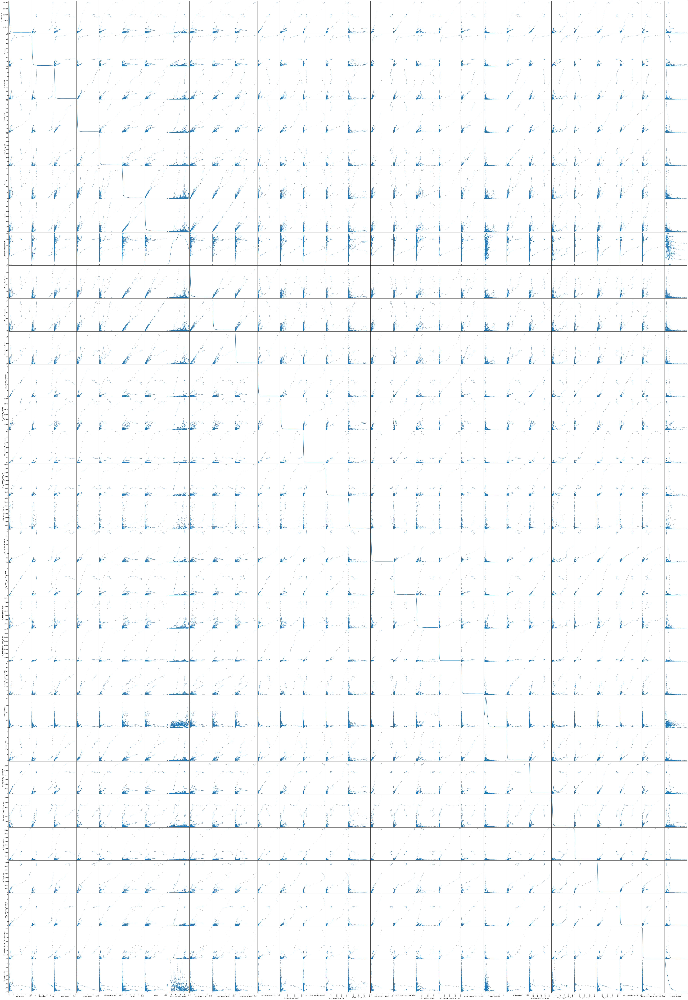

In [264]:
pd.plotting.scatter_matrix(df_year.loc[:, 'CO2_Emission':'Energy_Intensity'], diagonal="kde",figsize=(100,150))
plt.show()

In [265]:
# for G20 countries
df = df_g20
df_clustering = kmeans(year, k, df, features)
print(df_clustering['cluster_label'].value_counts())
print(df_clustering['cluster_scaled_label'].value_counts())
df_clustering[df_clustering['cluster_label'] == 1]

0    16
1     2
Name: cluster_label, dtype: int64
0    16
1     2
Name: cluster_scaled_label, dtype: int64


,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Export,Import,...,Industrial_GDP,Primary_Energy_Consumption,Renewable_Energy_Consumption,Coal_Consumption,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Energy_Intensity,cluster_label,cluster_scaled_label
302,China,CHN,2018,10289990.0,1.392730e+09,1.390000e+13,1.350000e+13,3.957610e+12,2.655590e+12,2.548880e+12,...,5.514440e+12,135736.14900,12931.937440,84313.94298,26742.51511,7109823.853,1832838.205,0.240148,1,1
1037,United States,USA,2018,5375491.0,3.268382e+08,2.060000e+13,1.960000e+13,9.619430e+07,2.533510e+12,3.129700e+12,...,3.818930e+12,92789.24944,7403.794459,13426.29193,41484.76809,4433935.757,743178.772,0.113073,1,1


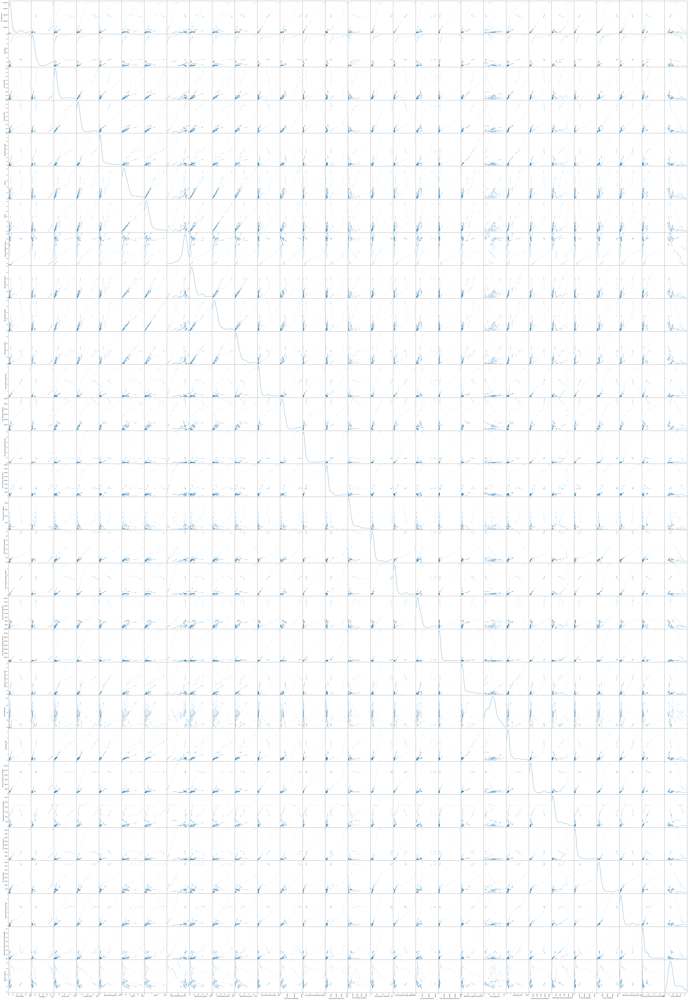

In [266]:
pd.plotting.scatter_matrix(df_g20.loc[:, 'CO2_Emission':'Energy_Intensity'], diagonal="kde",figsize=(100,150))
plt.show()

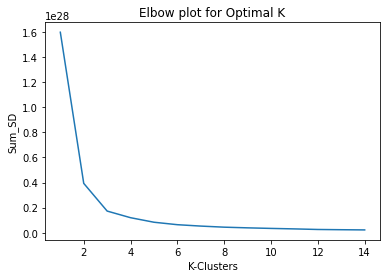

In [267]:
# To find optimize k using elbow
df = df_year.iloc[:, 3:]
sum_of_sqr_distance = []
k_range = range(1, 15)
for k in k_range:
    km_model2 = KMeans(n_clusters=k)
    km_model2.fit(df)
    sum_of_sqr_distance.append(km_model2.inertia_)

plt.plot(k_range, sum_of_sqr_distance)
plt.xlabel('K-Clusters')
plt.ylabel('Sum_SD')
plt.title("Elbow plot for Optimal K")
plt.show()

As seeing plot, we can assume the optimal k value is bewteen 2 to 4

In [277]:
from sklearn.metrics import silhouette_samples, silhouette_score

# using silhuette methods for finding optimal K

range_n_clusters = [2,3,4,5,6]
for n_clusters in range_n_clusters:
    km_model3 = KMeans(n_clusters = n_clusters)
    preds = km_model3.fit_predict(df)
    centers = km_model3.cluster_centers_
    
    score = silhouette_score(df, preds)
    print('For n_clusters = {}, silhuette score is {}'.format(n_clusters, score))

For n_clusters = 2, silhuette score is 0.9697063009965257
For n_clusters = 3, silhuette score is 0.899229151444084
For n_clusters = 4, silhuette score is 0.8728716008637449
For n_clusters = 5, silhuette score is 0.8699280905914599
For n_clusters = 6, silhuette score is 0.8065191669184405


We can find k=2 is the optimal value for clustering

In [213]:
# remove outlier, China and USA, then clustering again.
df_re_outlier = df_year[(df_year['Country_Name']!='China') & (df_year['Country_Name']!='United States')]
df_re_outlier.head()

,Country_Name,Country_Code,Year,CO2_Emission,Population,Current_GDP,Constant_GDP,Manufacturing_GDP,Export,Import,...,Medium_to_High_Tech_GDP,Trade_Openness,Industrial_GDP,Primary_Energy_Consumption,Renewable_Energy_Consumption,Coal_Consumption,Oil_Consumption,Total_Electricity_Production,Electricity_Production_from_Renewable,Energy_Intensity
8720,Aruba,ABW,2000,2378.0,90866.0,1.963194e+09,2.814470e+09,6.271782e+07,1.393855e+09,1.324022e+09,...,0.000000e+00,138.441596,2.964804e+08,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
8721,Afghanistan,AFG,2000,758.0,20779957.0,3.342034e+09,5.344642e+09,5.426053e+08,0.000000e+00,0.000000e+00,...,7.374464e+07,0.000000,0.000000e+00,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000
8722,Angola,AGO,2000,9516.0,16395477.0,1.220735e+10,4.009233e+10,3.527729e+08,8.187989e+09,5.739005e+09,...,1.594033e+07,114.086915,6.584563e+09,301.040759,221.087648,0.0,0.0,0.0,0.0,0.179342
8723,Albania,ALB,2000,3004.0,3089027.0,3.487586e+09,6.057248e+09,1.505896e+08,7.000861e+08,1.508347e+09,...,1.146133e+07,63.322673,6.750374e+08,75.076190,31.115327,0.0,0.0,0.0,0.0,0.296036
8724,Andorra,AND,2000,524.0,65390.0,1.429045e+09,2.239867e+09,5.474475e+07,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000


In [230]:
# getting optimal number of clustering except USA and China
df = df_re_outlier.iloc[:, 3:]
range_n_clusters = [2,3,4,5,6]
for n_clusters in range_n_clusters:
    km_model3 = KMeans(n_clusters = n_clusters)
    preds = km_model3.fit_predict(df)
    centers = km_model3.cluster_centers_
    
    score = silhouette_score(df, preds)
    print('For n_clusters = {}, silhuette score is {}'.format(n_clusters, score))

For n_clusters = 2, silhuette score is 0.8945797119014172
For n_clusters = 3, silhuette score is 0.8561307894078731
For n_clusters = 4, silhuette score is 0.7927392501325742
For n_clusters = 5, silhuette score is 0.7636411391118453
For n_clusters = 6, silhuette score is 0.7554378579748988


In [309]:
# to get optimal k value, use yellowbrick method
from yellowbrick.cluster import silhouette_visualizer
from yellowbrick.cluster import KElbowVisualizer
 

    
def yellow_vis(df, min, max):
    x = df
    scale_x = StandardScaler().fit_transform(x) 

    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(1, 10))
    vis1 = visualizer.fit(x)
#    vis2 = visualizer.fit(scale_x)
    
    vis1
#    vis2


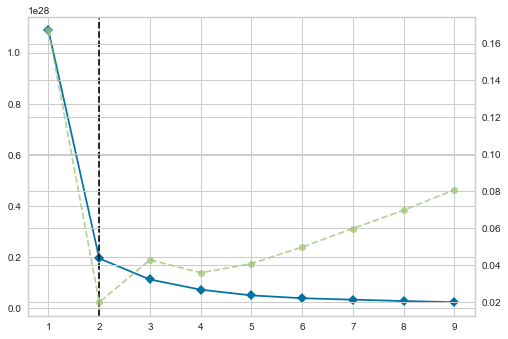

In [310]:
yellow_vis(df_g20.iloc[:, 3:], 1, 10)

The blue line is an indicator that confirms the group's volatility. The variability decreases sharply when the number of clusters increases from 1 to 2, but there is almost no variability after the number of clusters increases. Two can be considered the most appropriate. A vertical dotted line also indicates the optimal number of clusters.

The green dotted line is the time taken to learn the cluster. It takes the least time when there are two clusters. As the number of clusters increases, the learning time seems to take longer, but when the number of clusters is 2, it takes longer than 3 clusters. This means that learning takes less time when clustering is good.